## Model Evaluation

In [4]:
import numpy as np
import pandas as pd
import librosa
import seaborn as sns
import matplotlib.pyplot as plt
import IPython.display as ipd

from IPython.display import Image
from sklearn.metrics import confusion_matrix
from data_load import load_image_data
from reporting_functions import confusion_matrix_stats, plot_confusion_matrix_nn, get_tp_tn_lists

In [5]:
# Specify Configuration
audio_path = "../data/Data/genres_original"
model_name = "amplitude-hybrid-4-3-pca32"
classes=["pop","classical"]
target = "label"

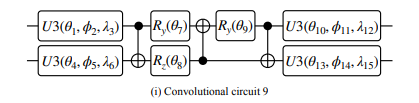

In [6]:
Image(filename=f"../img/{model_name}.PNG")

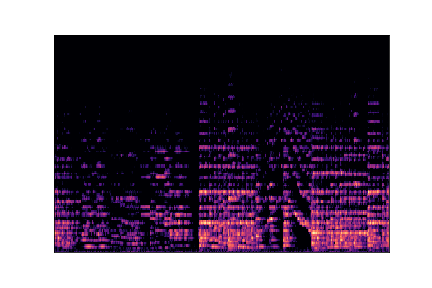

In [7]:
Image(filename=f"../data/Data/images_original/classical/classical00020.png")

In [8]:
# Load results
cf_matrix = pd.read_csv(f"./results/{model_name}-confusion-matrix.csv", index_col=0)
loss_history = pd.read_csv(f"./results/{model_name}-loss-history.csv")
estimate_vs_class = pd.read_csv(f"./results/{model_name}-yhat-class-vs-y-test.csv", index_col=0)
y_hat = pd.read_csv(f"./results/{model_name}-yhat.csv", index_col=0)

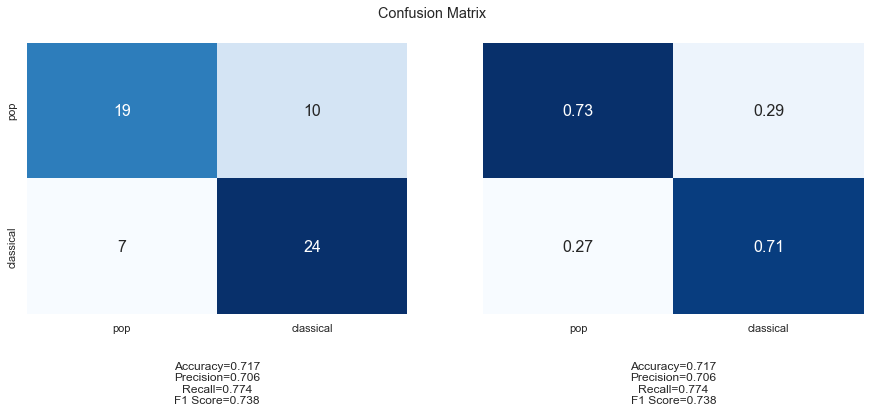

In [9]:
# Plot Confusion Matrix
stats_text = confusion_matrix_stats(cf_matrix)
plot_confusion_matrix_nn(cf_matrix, classes, stats_text)

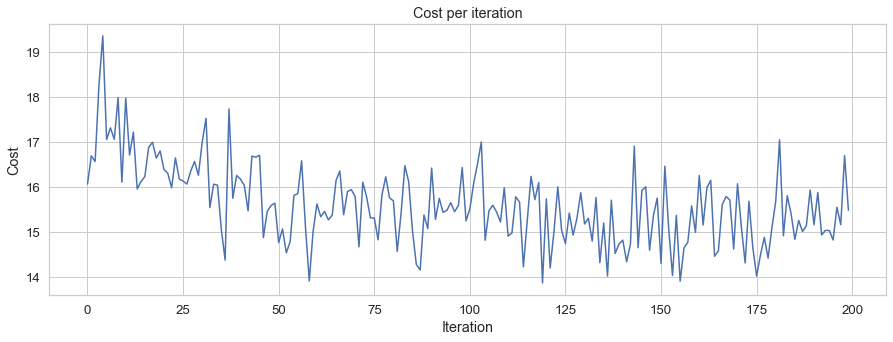

In [10]:
plt.figure(figsize=(15,5))
loss_history.columns = ["Iteration", "Cost"]
sns.set(font_scale=1.2)
with sns.axes_style("whitegrid"):
    ax = sns.lineplot(
        data=loss_history,
        x="Iteration", y="Cost",
        markers=True, dashes=False,
    )
    ax.set_title("Cost per iteration")

In [11]:
data_path = "../data/Data/features_30_sec.csv"
target = "label"
classes = ["pop", "classical"]

Xy = pd.read_csv(data_path)

# returns "classical|pop" etc depending on class selection
filter_pat = "|".join(genre for genre in classes)
indices = Xy["filename"].str.contains(filter_pat)

# Select only data for relevant classes
Xy = Xy.loc[indices, :].copy()

X_train, y_train, X_test, y_test = load_image_data(data_path, classes, target)
estimate_vs_class.index = y_test.index

In [12]:
TP, TN, FP, FN = get_tp_tn_lists(estimate_vs_class, y_test)

In [13]:
def get_rnd_audio_sample(data, class_type, target="label"):    
    idx = data.loc[class_type[class_type==True].sample(1).index].index
    filename, genre = data.loc[idx, "filename"].iloc[0], data.loc[idx, target].iloc[0]
    return filename, genre

def plot_spectogram(audio_path, filename, genre):
    audio_ts , sample_rate = librosa.load(f"{audio_path}/{genre}/{filename}")
    X = librosa.stft(audio_ts)
    Xdb = librosa.amplitude_to_db(abs(X))
    plt.figure(figsize=(20,10))
    librosa.display.specshow(Xdb, sr=sample_rate, x_axis='time', y_axis='log')
    plt.colorbar()

In [14]:
#filename, genre = get_rnd_audio_sample(Xy, TP)
filename, genre = "classical.00029.wav", classes[1]
print(f"Example of true positive {filename} predicted as {classes[1]}\n")
ipd.Audio(f"{audio_path}/{genre}/{filename}")

Example of true positive classical.00029.wav predicted as classical



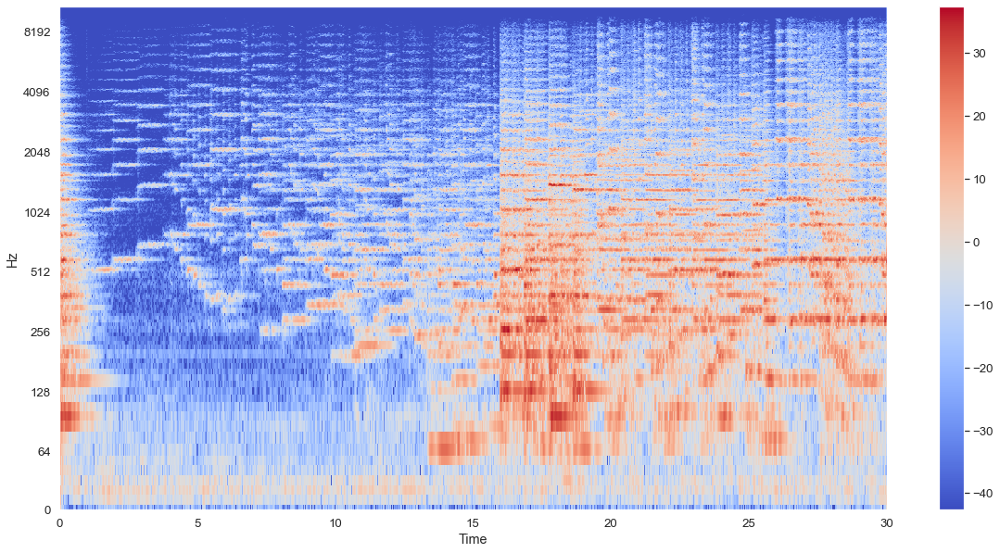

In [15]:
plot_spectogram(audio_path, filename, genre)

In [18]:
#filename, genre = get_rnd_audio_sample(Xy, FP)
filename, genre = "pop.00040.wav", classes[0]
print(f"Example of false positive {filename} model predicted {classes[1]}\n")
ipd.Audio(f"{audio_path}/{genre}/{filename}")

Example of false positive pop.00040.wav model predicted classical



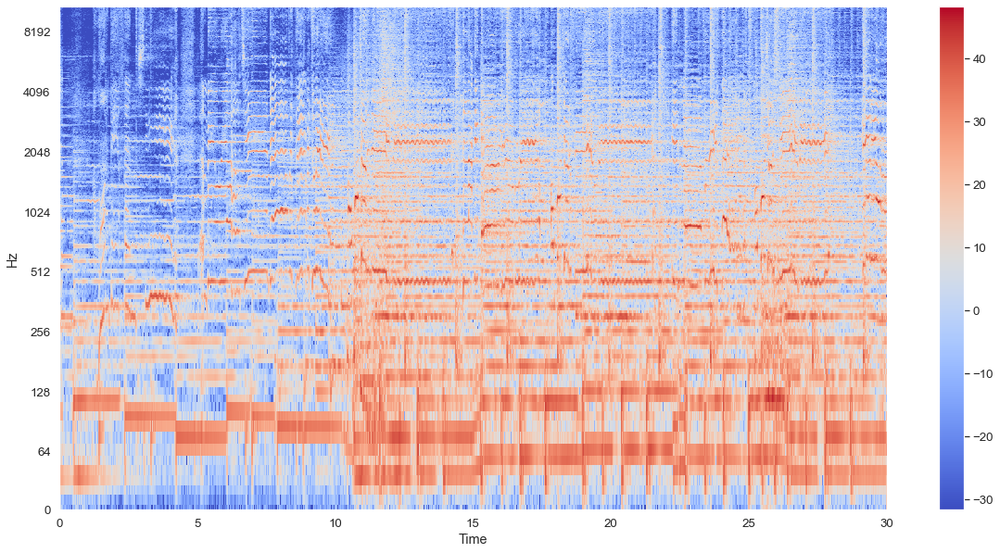

In [19]:
plot_spectogram(audio_path, filename, genre)

In [71]:
# filename, genre = get_rnd_audio_sample(Xy, FN)
filename, genre = "classical.00076.wav", classes[1]
print(f"Example of false negative {filename} predicted as {classes[0]}\n")

ipd.Audio(f"{audio_path}/{genre}/{filename}")

Example of false negative classical.00076.wav predicted as pop



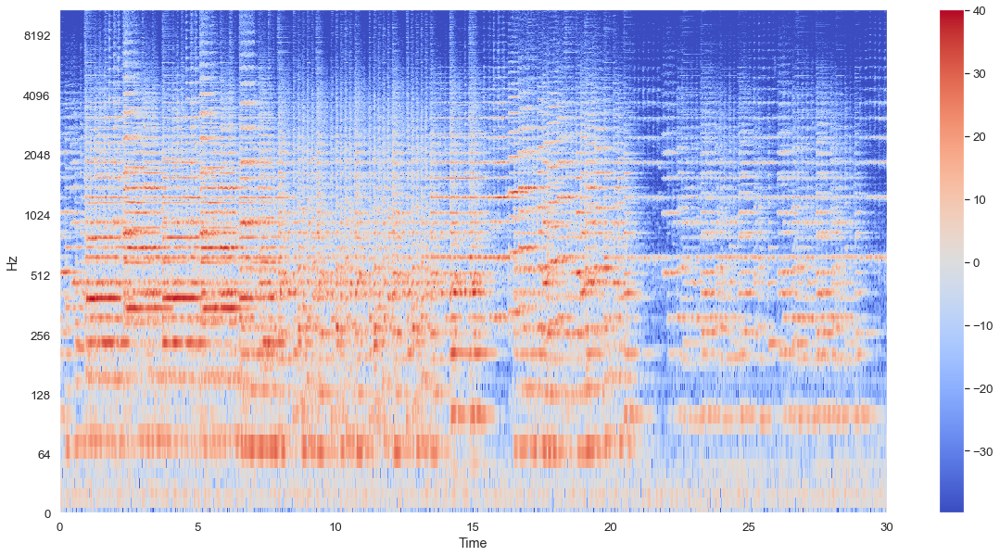

In [72]:
plot_spectogram(audio_path, filename, genre)

In [20]:
# filename, genre = get_rnd_audio_sample(Xy, TN)
filename, genre = "pop.00028.wav", classes[0]
print(f"Example of true negative {filename} predicted as {classes[0]}\n")
ipd.Audio(f"{audio_path}/{genre}/{filename}")

Example of true negative pop.00028.wav predicted as pop



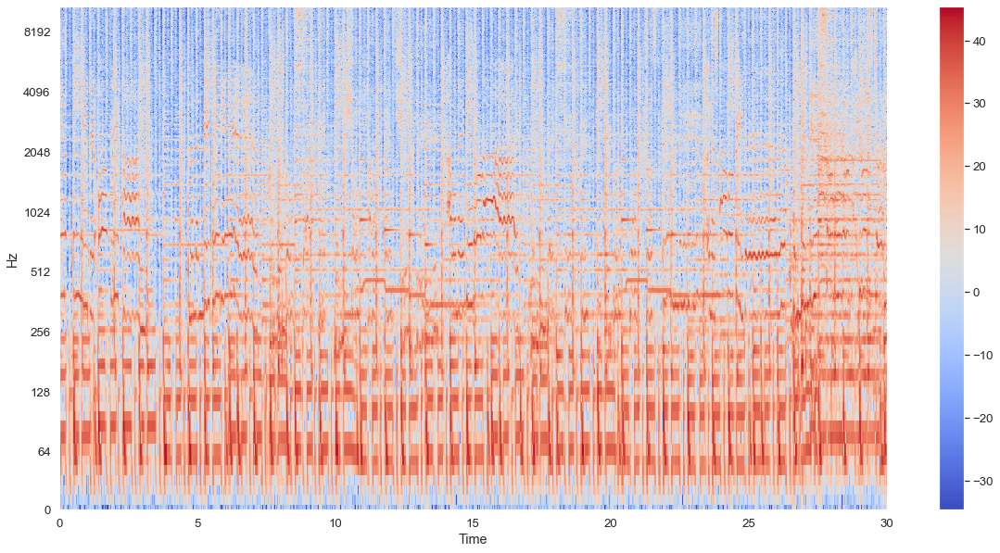

In [21]:
plot_spectogram(audio_path, filename, genre)